In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

file_path = "ECG_Fourier_Transform_Features.csv"
df = pd.read_csv(file_path)

print(df.info())
print(df.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20860 entries, 0 to 20859
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ecg_id               20860 non-null  int64  
 1   Patient_ID           20860 non-null  float64
 2   Label                20860 non-null  object 
 3   Dominant Frequency   20860 non-null  float64
 4   Frequency Power Sum  20860 non-null  float64
 5   Mean Frequency       20860 non-null  float64
 6   Spectral Entropy     20860 non-null  float64
 7   MFCC_1               20860 non-null  float64
 8   MFCC_2               20860 non-null  float64
 9   MFCC_3               20860 non-null  float64
 10  MFCC_4               20860 non-null  float64
 11  MFCC_5               20860 non-null  float64
 12  MFCC_6               20860 non-null  float64
 13  MFCC_7               20860 non-null  float64
 14  MFCC_8               20860 non-null  float64
 15  MFCC_9               20860 non-null 

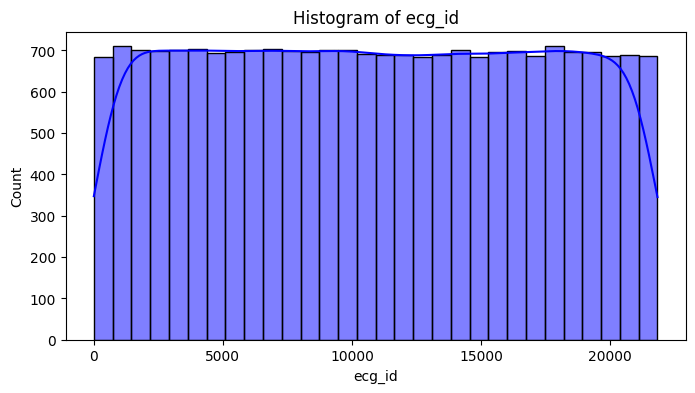

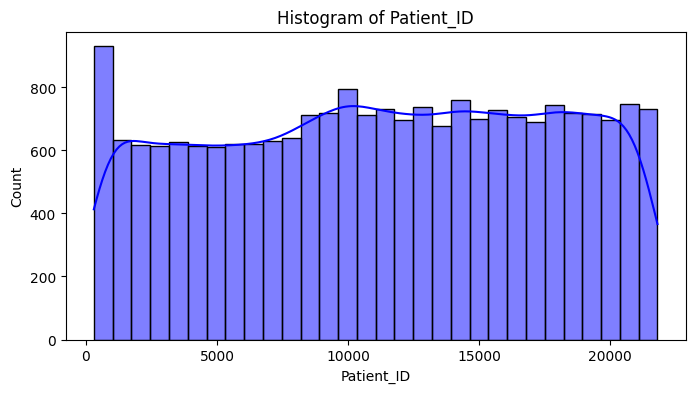

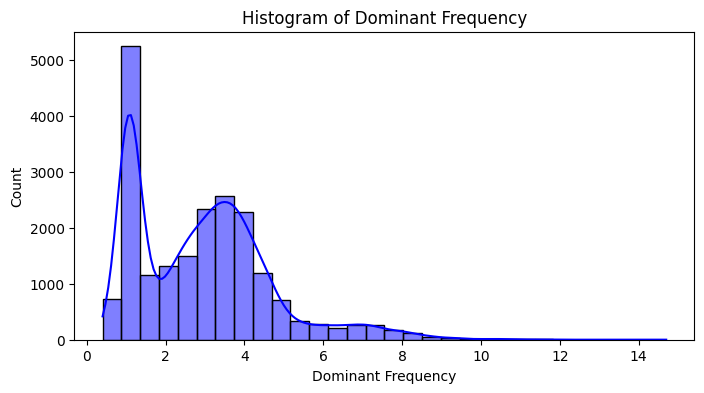

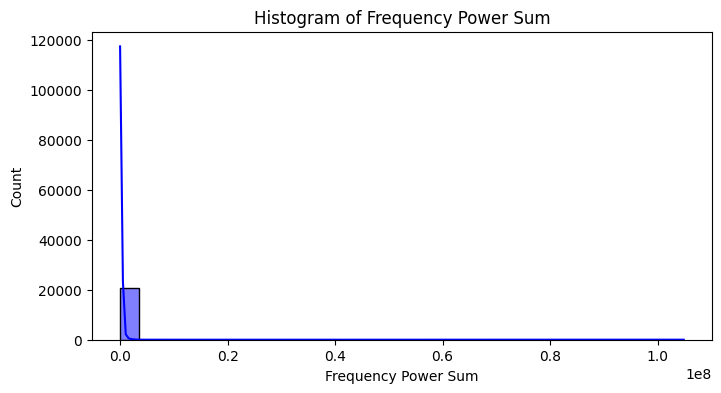

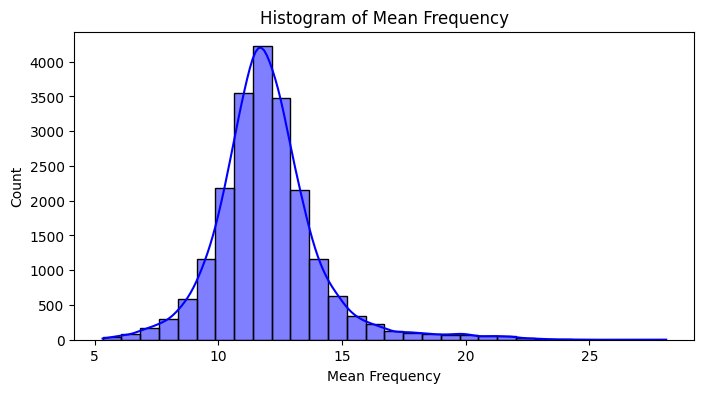

...

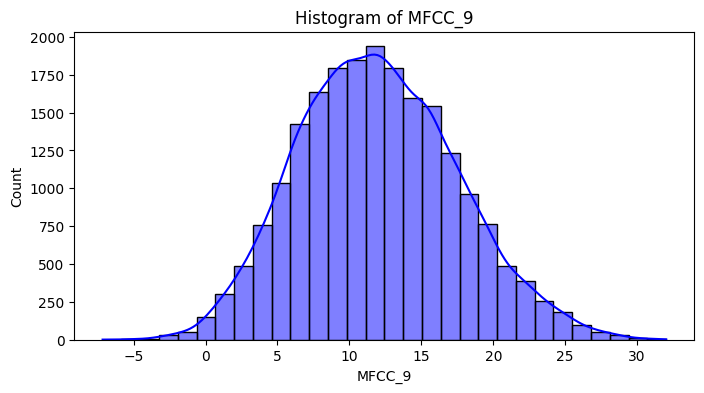

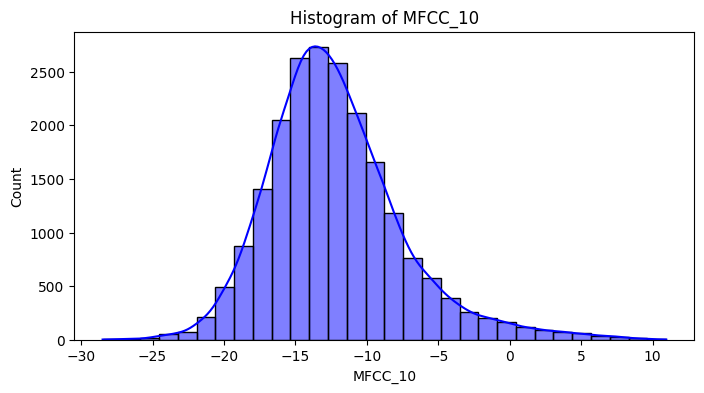

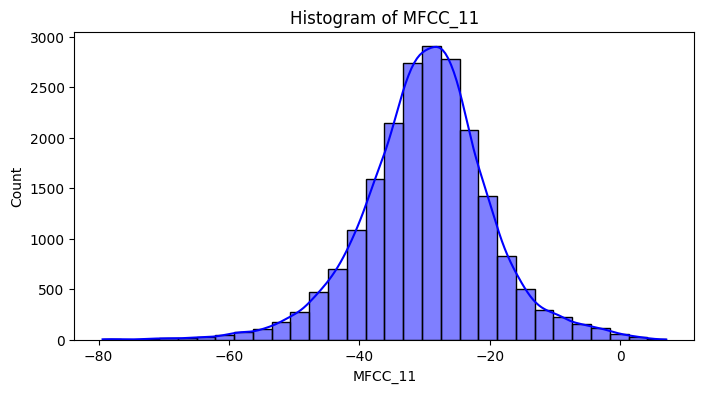

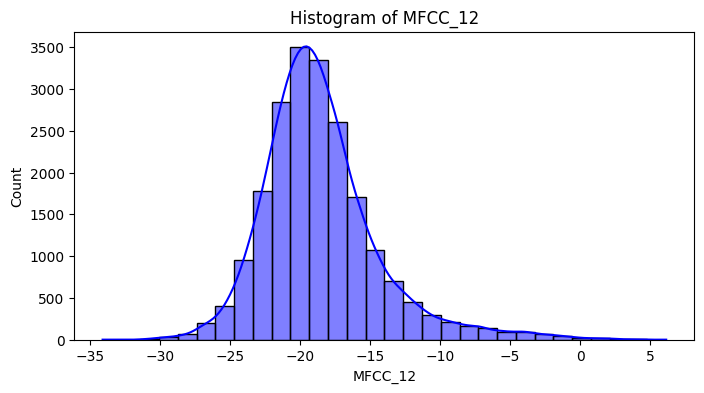

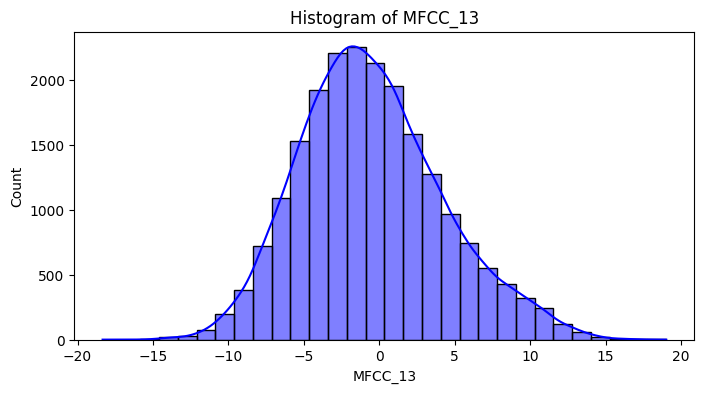

In [2]:
# histogram for numerical features
numerical_cols = df.select_dtypes(include=np.number).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[col], kde=True, bins=30, color='blue')
    plt.title(f'Histogram of {col}')
    plt.show()


C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\3097418526.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis')


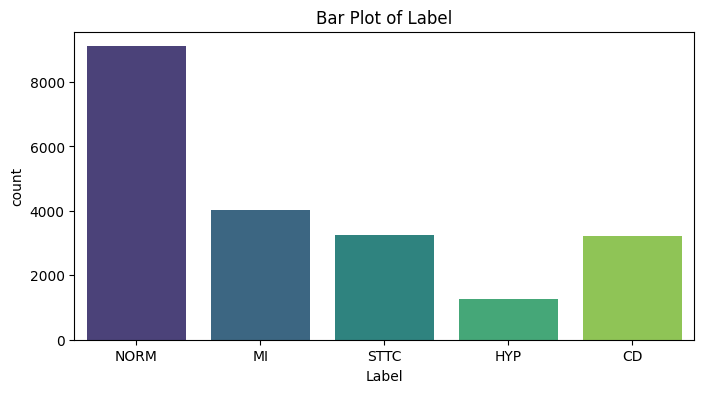

In [3]:
# bar plots for categorical features
categorical_cols = df.select_dtypes(include='object').columns
for col in categorical_cols:
    plt.figure(figsize=(8, 4))
    sns.countplot(x=col, data=df, palette='viridis')
    plt.title(f'Bar Plot of {col}')
    plt.show()

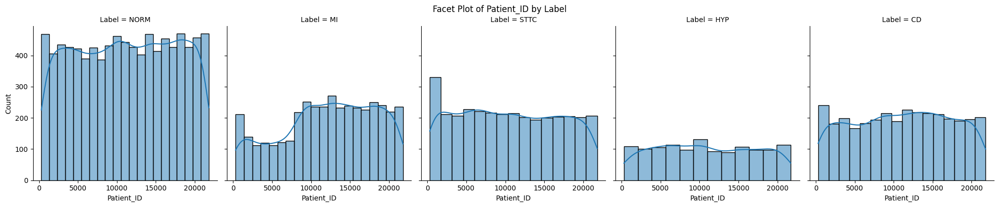

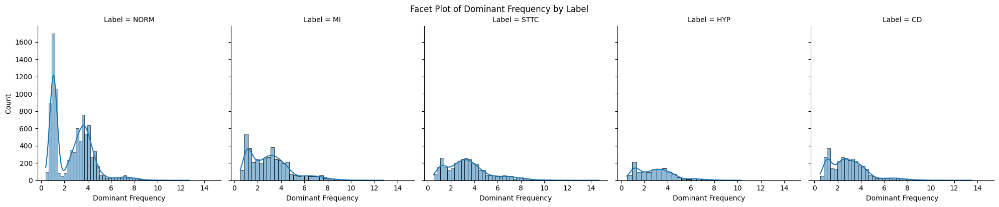

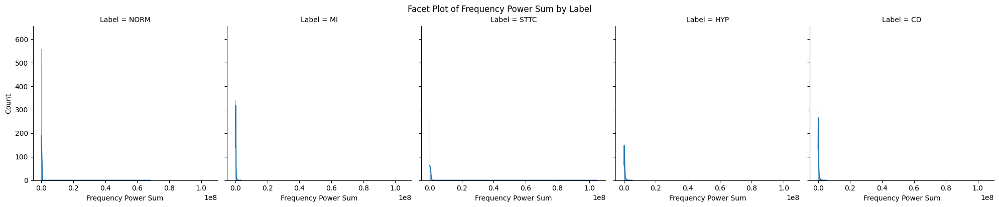

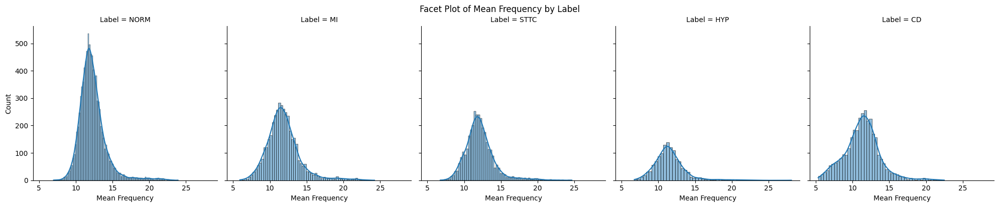

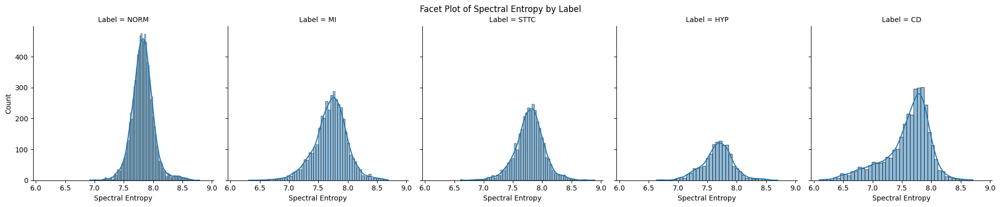

...

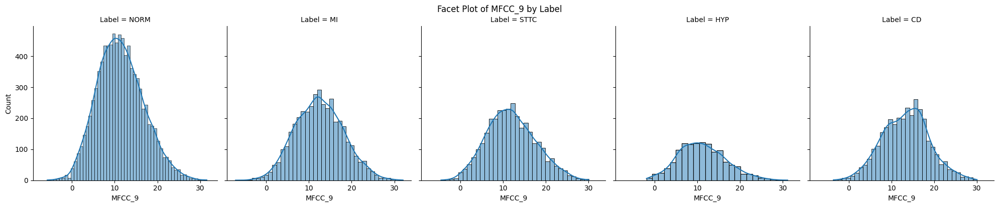

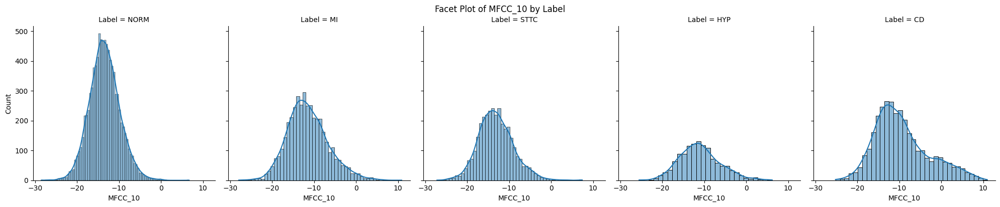

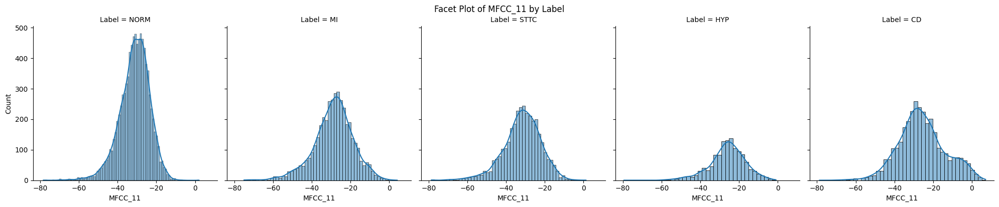

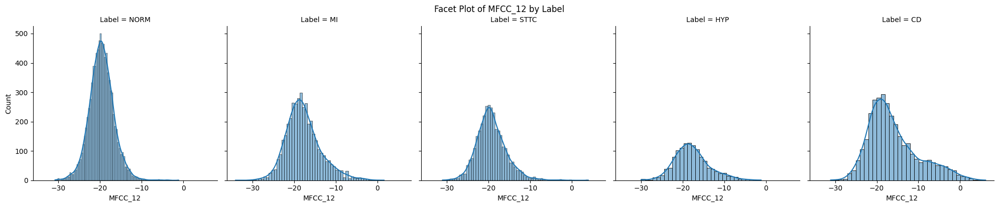

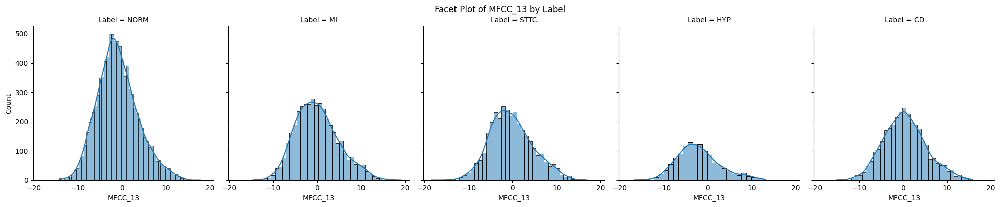

In [4]:
# Facet plot
for col in numerical_cols:
    if col != "ecg_id":  # Skip identifiers
        g = sns.FacetGrid(df, col="Label", sharex=True, sharey=True, height=4)
        g.map(sns.histplot, col, kde=True)
        g.fig.suptitle(f"Facet Plot of {col} by Label", y=1.02)
        plt.show()

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\2315989714.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")


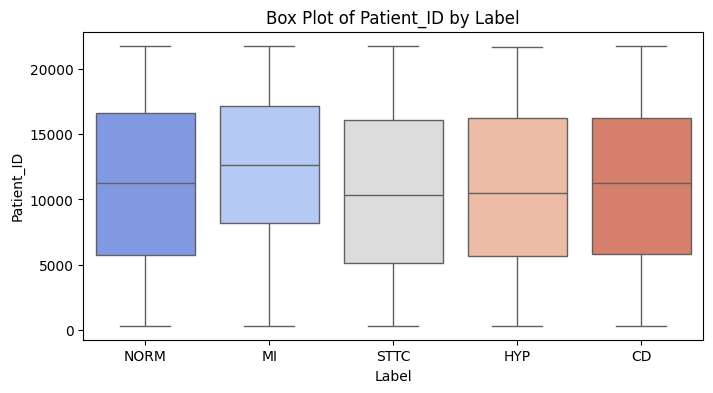

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\2315989714.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")


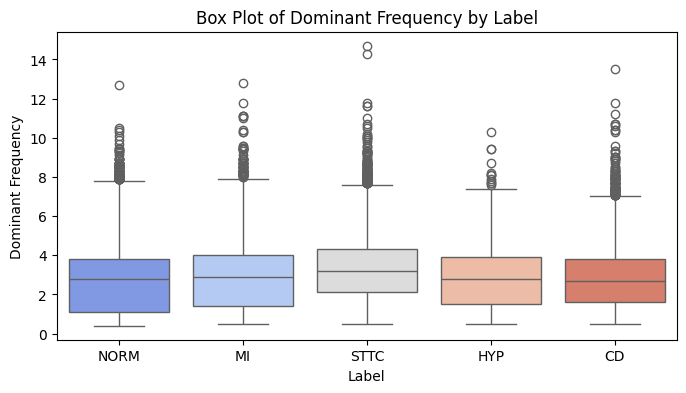

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\2315989714.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")


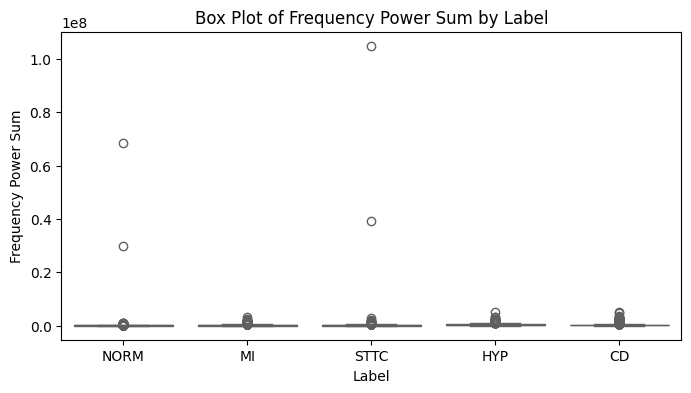

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\2315989714.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")


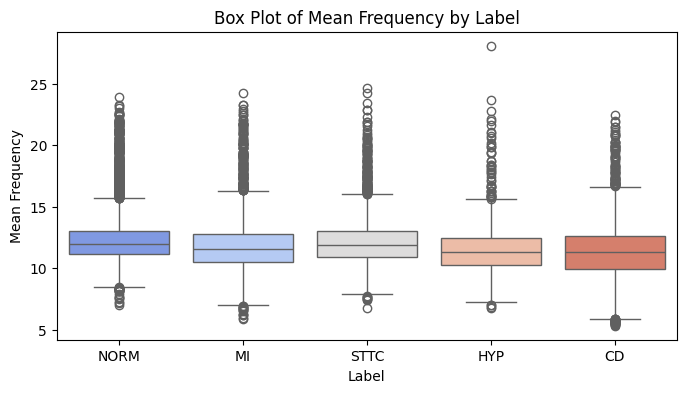

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\2315989714.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")


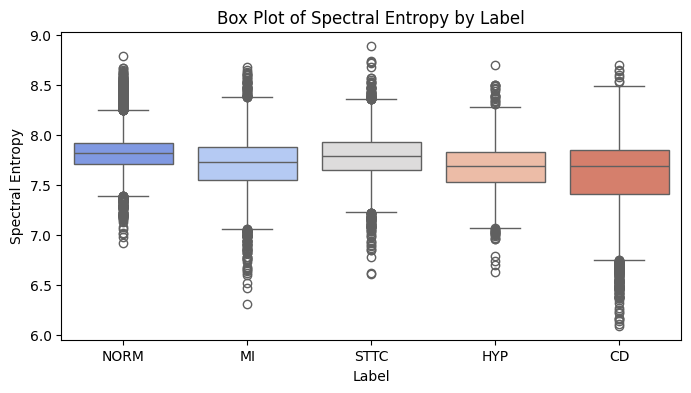

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\2315989714.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")


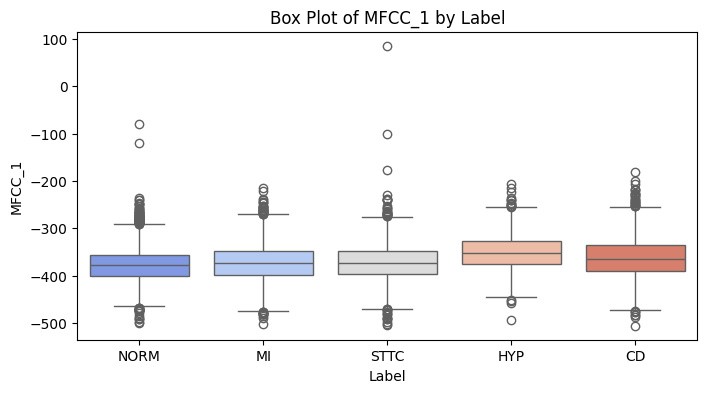

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\2315989714.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")


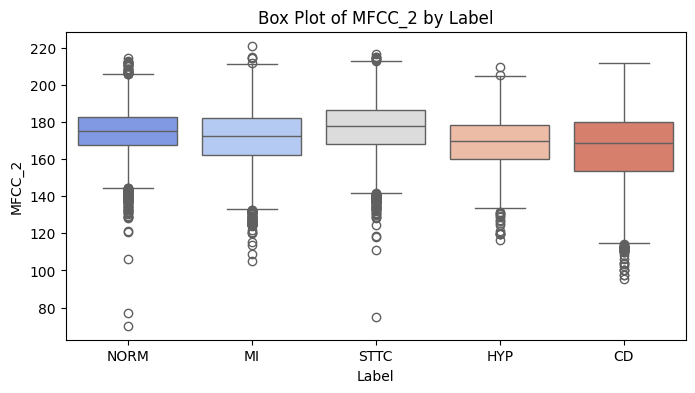

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\2315989714.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")


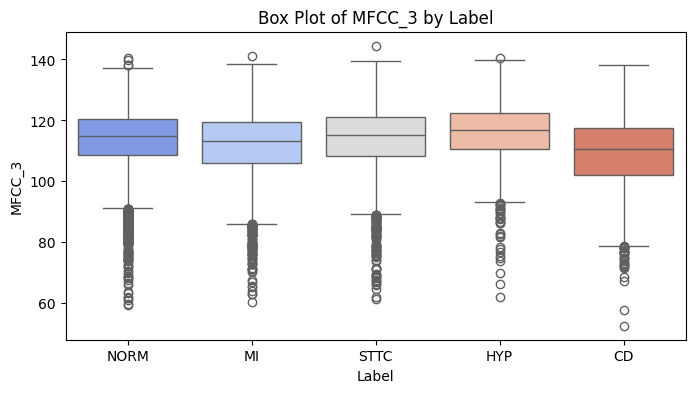

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\2315989714.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")


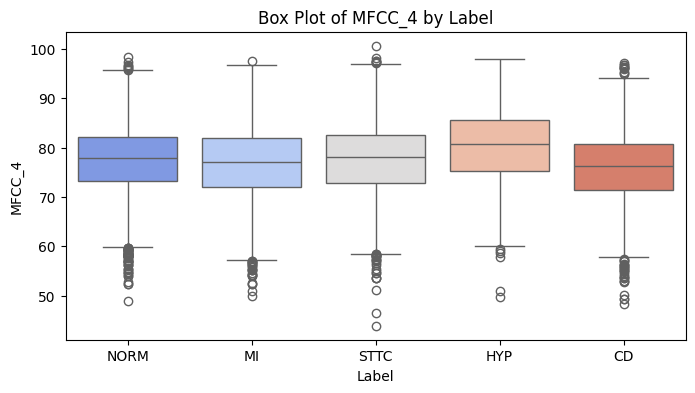

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\2315989714.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")


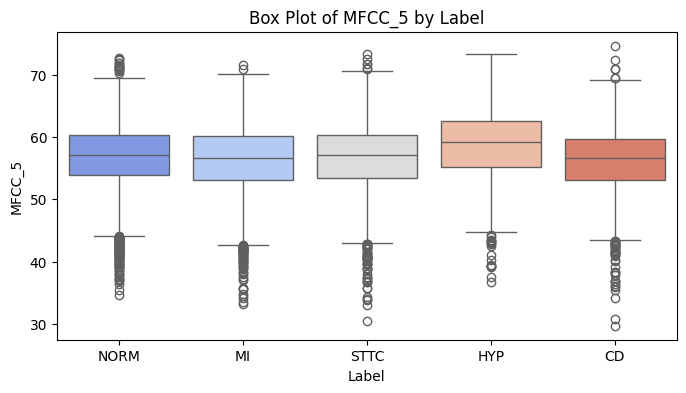

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\2315989714.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")


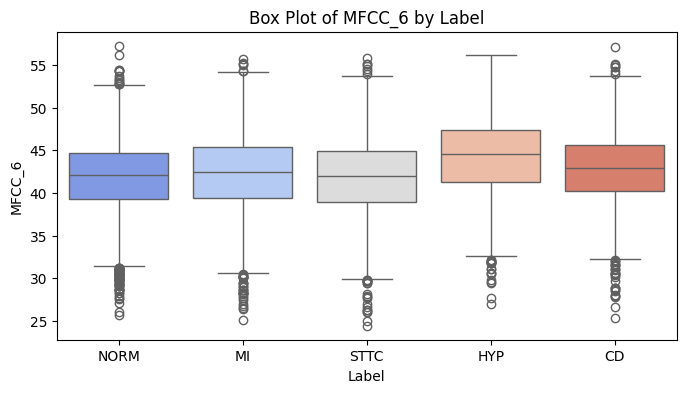

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\2315989714.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")


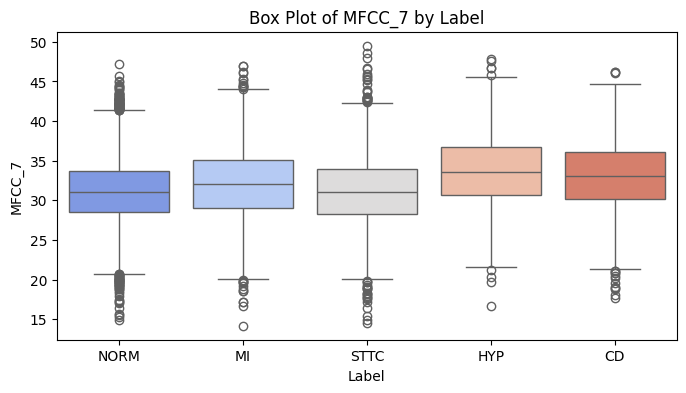

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\2315989714.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")


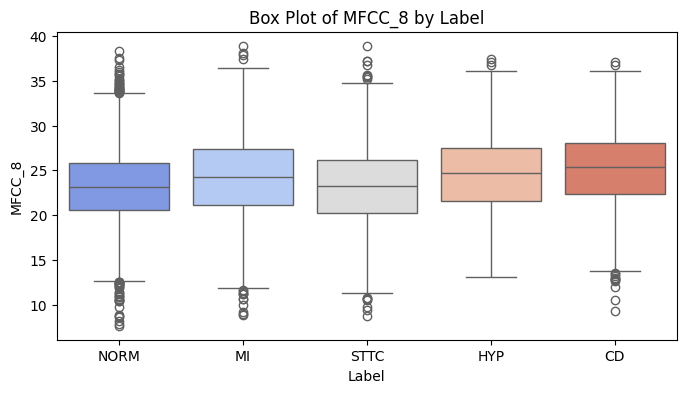

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\2315989714.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")


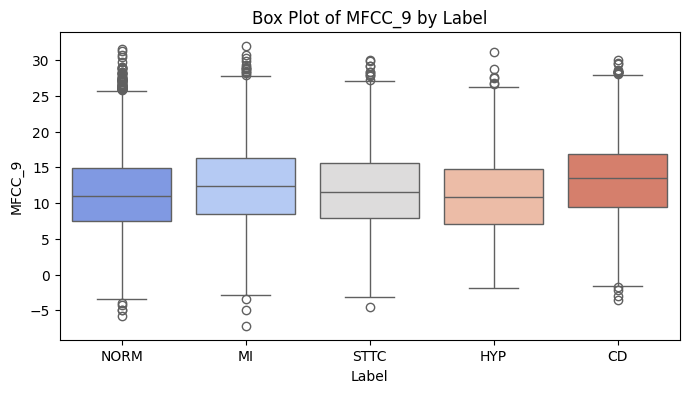

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\2315989714.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")


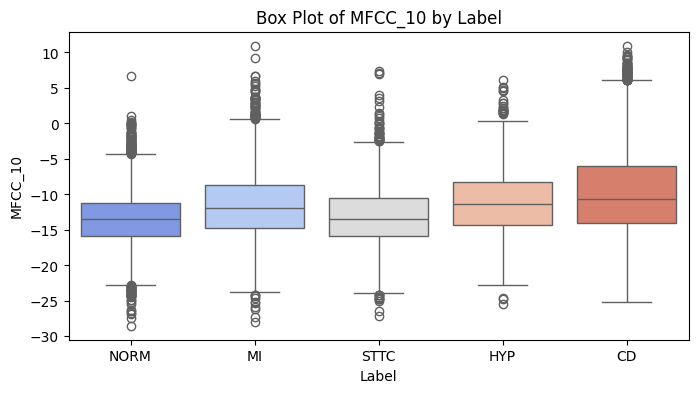

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\2315989714.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")


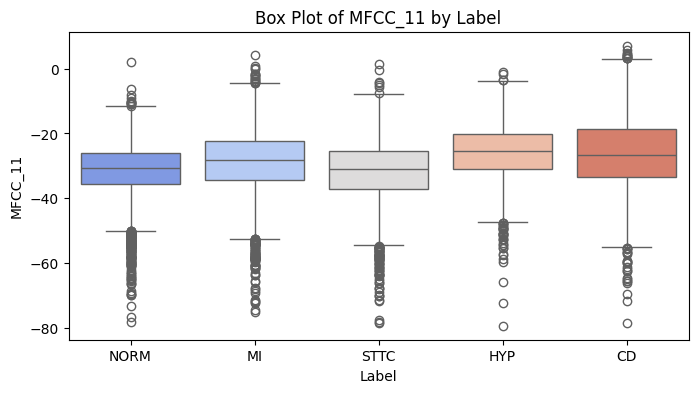

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\2315989714.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")


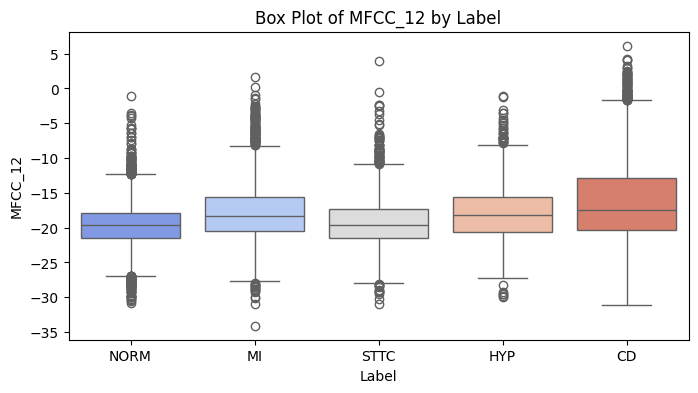

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\2315989714.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")


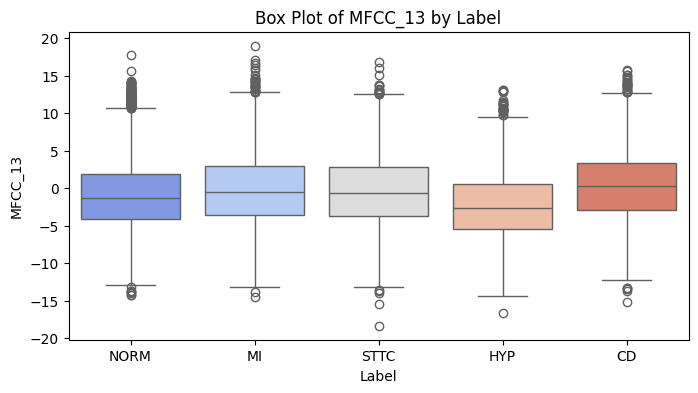

Outliers in Patient_ID: []
Outliers in Dominant Frequency: [  297   414   586   667   780   825   838  1095  1222  1319  1340  1344
  1350  1494  1510  1674  1691  1745  1803  1850  1867  1891  1911  2003
  2134  2287  2515  2523  2555  2566  2785  2786  2802  2827  2835  2841
  2886  3206  3249  3394  3396  3541  3549  3678  3884  3895  3897  4005
  4022  4182  4198  4378  4385  4414  4458  4462  4571  4747  4915  4963
  4994  5196  5313  5335  5350  5354  5518  5565  5824  5839  6073  6125
  6133  6171  6251  6447  6498  6551  6905  6952  6988  7108  7172  7291
  7402  7436  7448  7577  7610  7893  7921  8011  8065  8093  8142  8176
  8223  8231  8251  8529  8708  8926  9059  9635  9662  9666  9689  9749
  9767  9808 10053 10123 10470 10493 10637 10738 10759 10797 10820 10936
 11054 11086 11158 11240 11265 11293 11304 11413 11521 11690 11700 11791
 11885 11903 12099 12241 12499 12620 12675 12831 13299 13332 13349 13370
 13624 13636 13664 13787 13837 13867 13895 13918 14092 14096 1418

In [5]:
# Outlier analysis
for col in numerical_cols:
    if col != "ecg_id":
        plt.figure(figsize=(8, 4))
        sns.boxplot(x="Label", y=col, data=df, palette="coolwarm")
        plt.title(f"Box Plot of {col} by Label")
        plt.show()

# Outlier analysis using Z-scores
outliers = {}
for col in numerical_cols:
    if col != "ecg_id":
        z_scores = zscore(df[col])
        outliers[col] = np.where(np.abs(z_scores) > 3)[0]
        print(f"Outliers in {col}: {outliers[col]}")


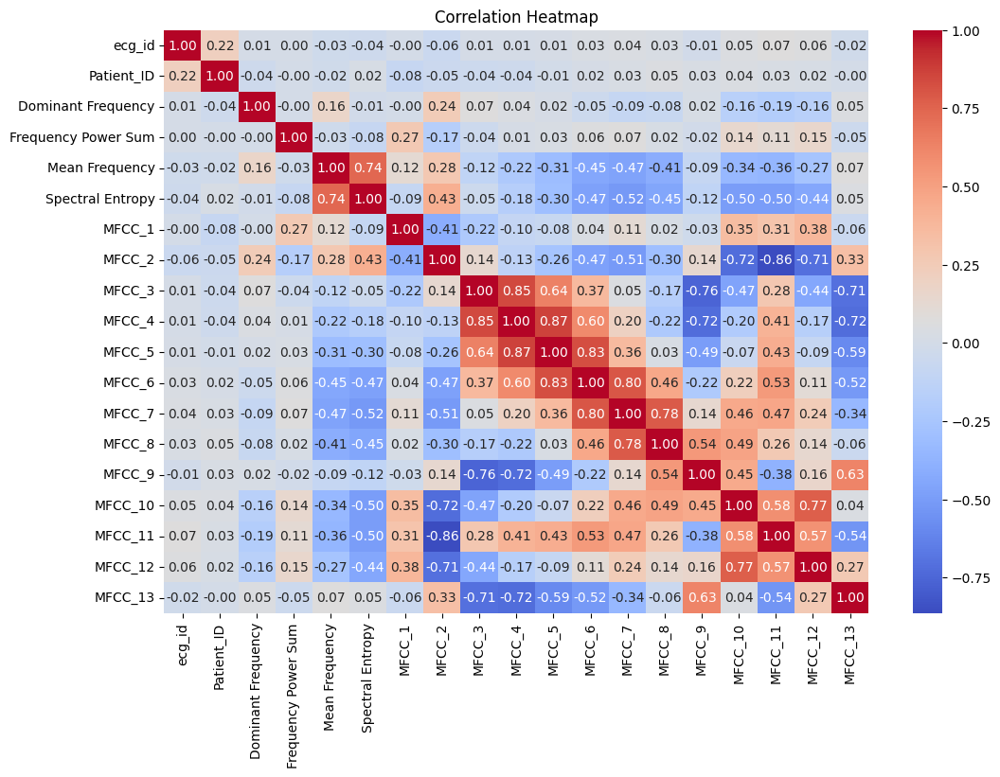

In [8]:
# Correlation Heatmap
numeric_cols = df.select_dtypes(include=np.number).columns
corr = df[numeric_cols].corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()


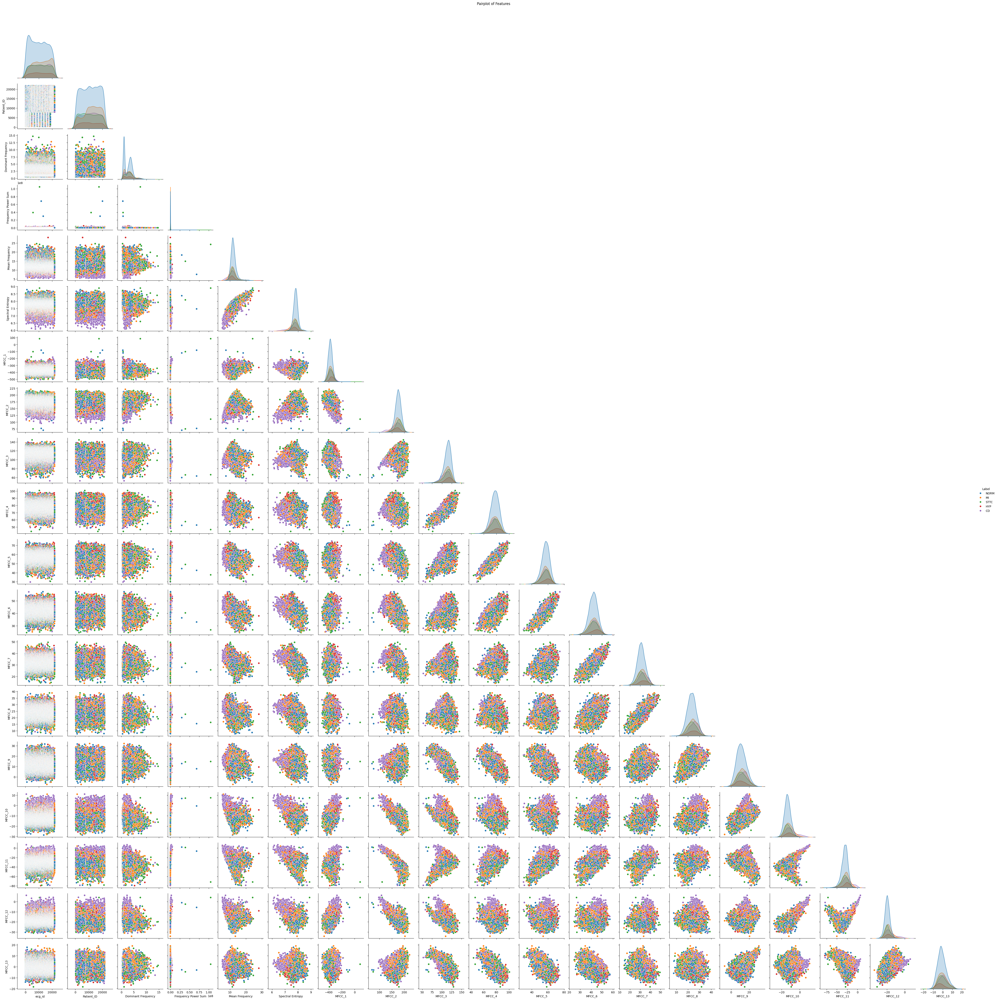

In [9]:
numeric_cols_with_label = df.select_dtypes(include=np.number).columns.tolist() + ["Label"]
sns.pairplot(df[numeric_cols_with_label], hue="Label", diag_kind="kde", corner=True)
plt.suptitle("Pairplot of Features", y=1.02)
plt.show()

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\1477479357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)


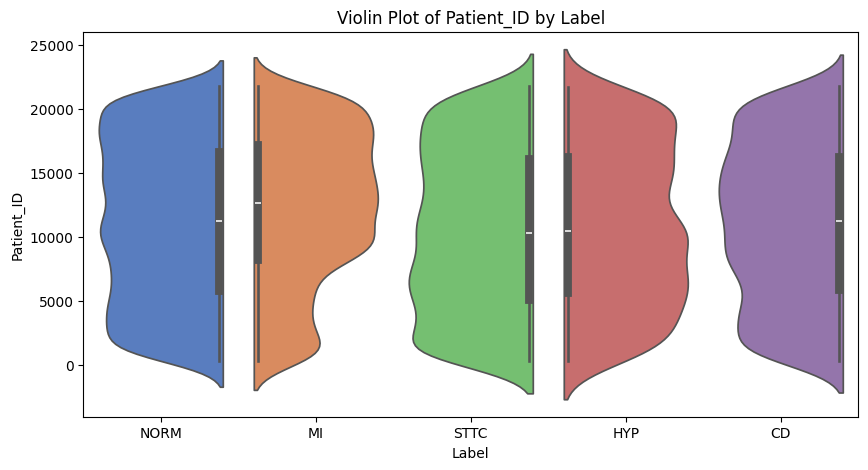

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\1477479357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)


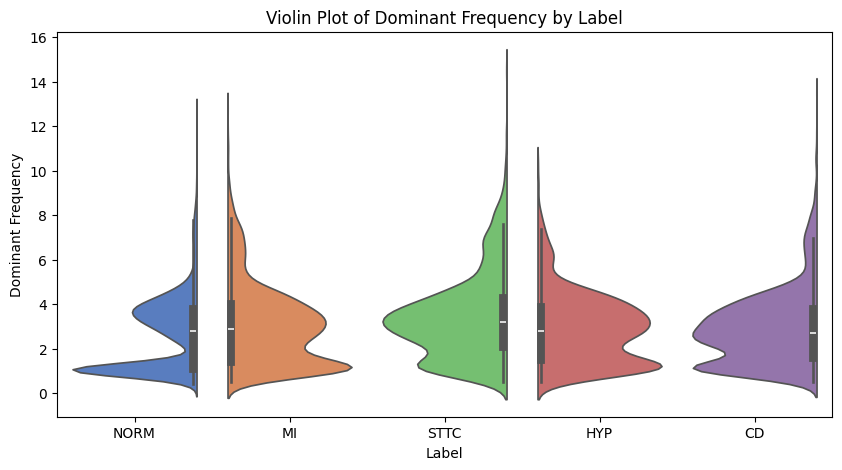

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\1477479357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)


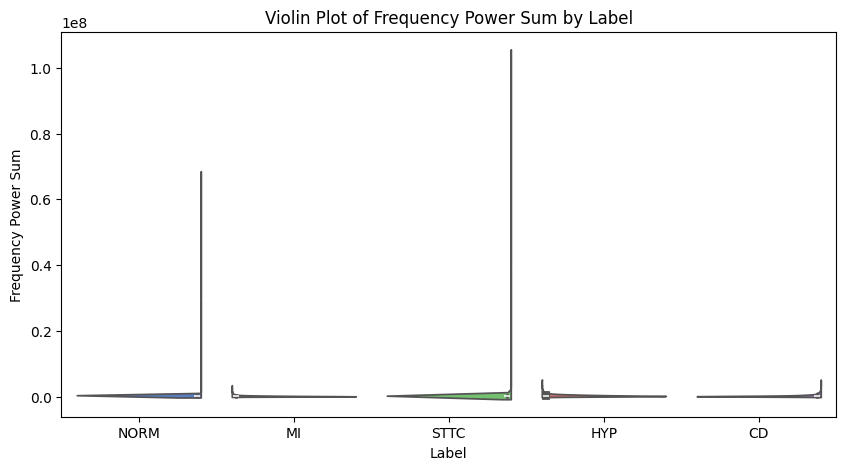

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\1477479357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)


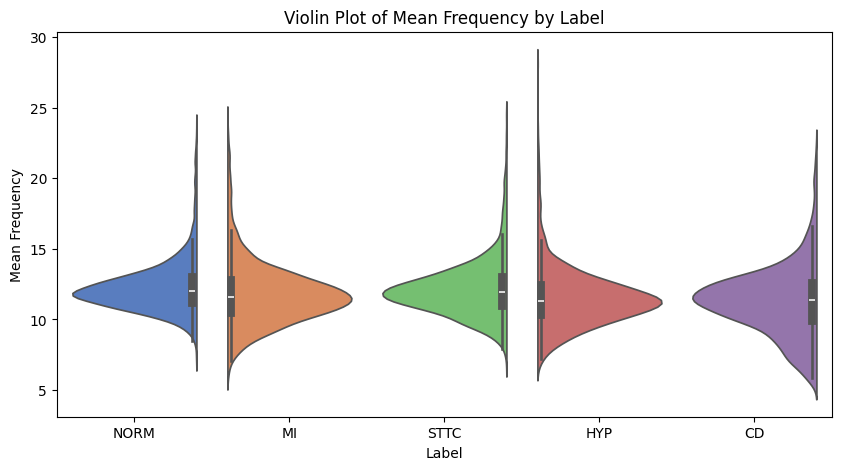

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\1477479357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)


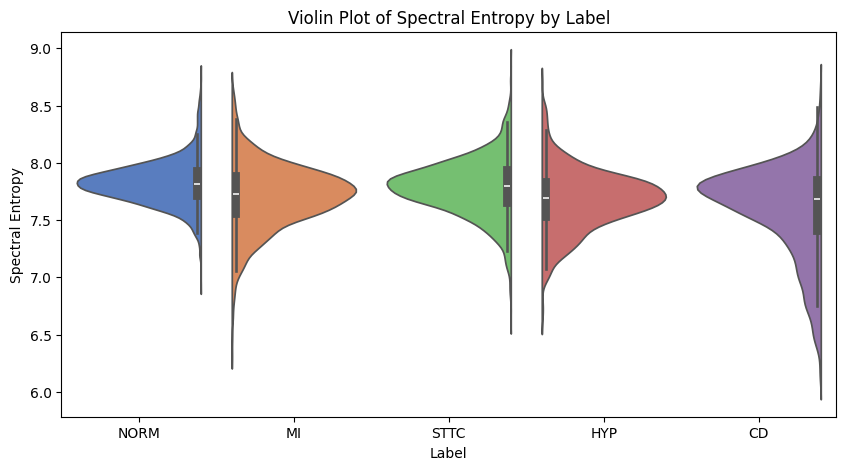

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\1477479357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)


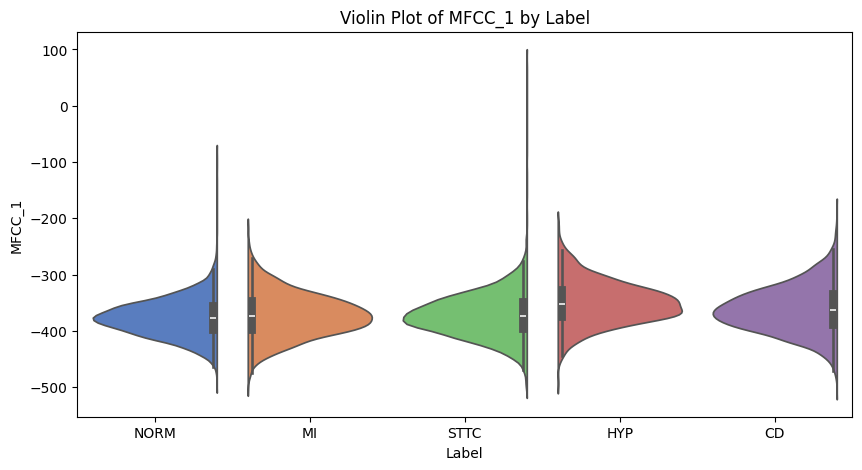

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\1477479357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)


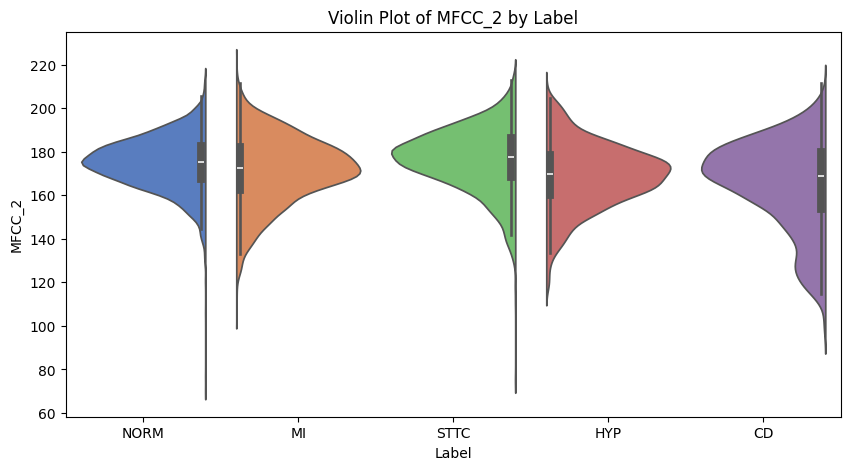

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\1477479357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)


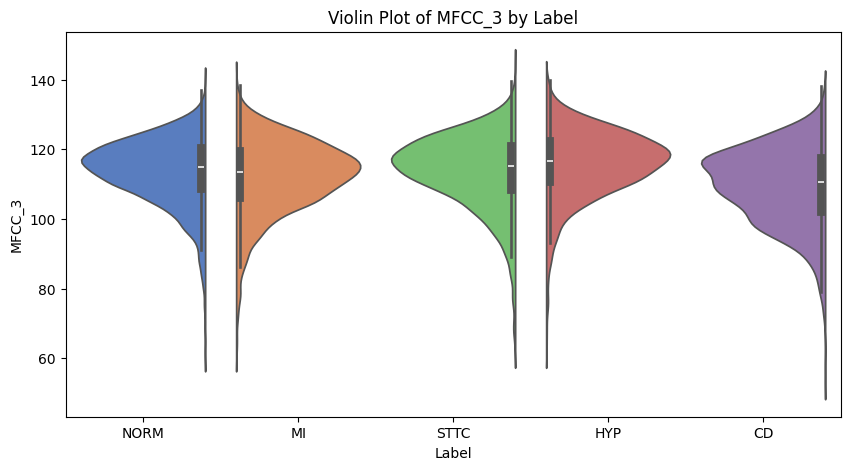

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\1477479357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)


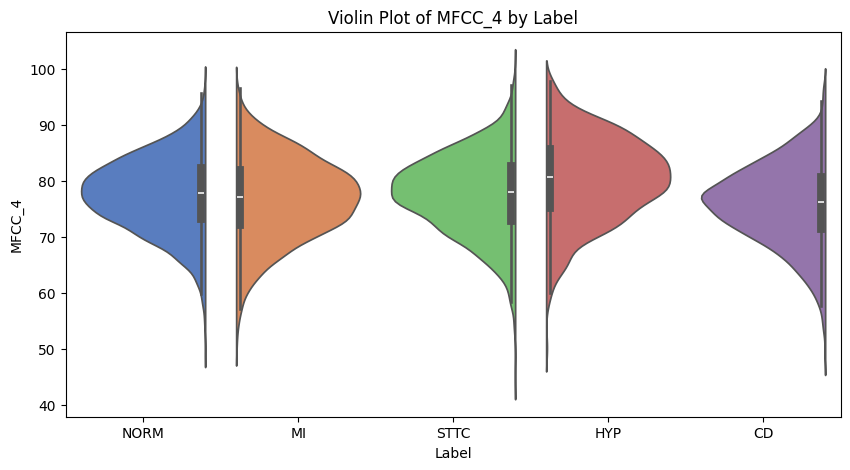

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\1477479357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)


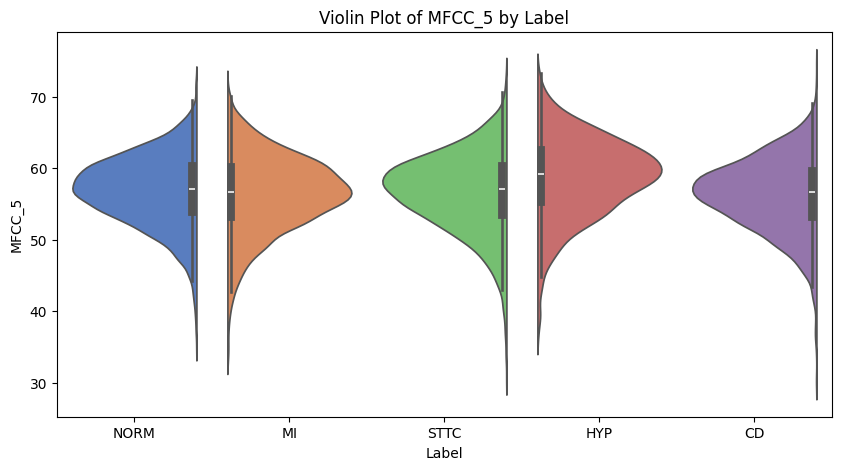

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\1477479357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)


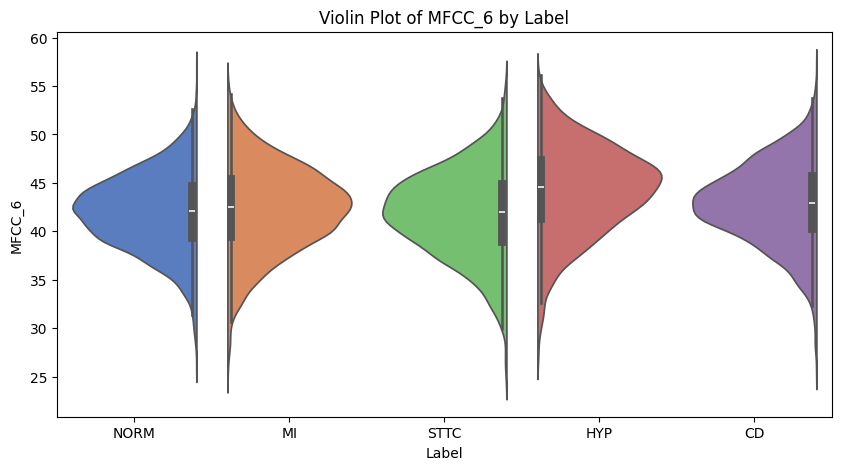

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\1477479357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)


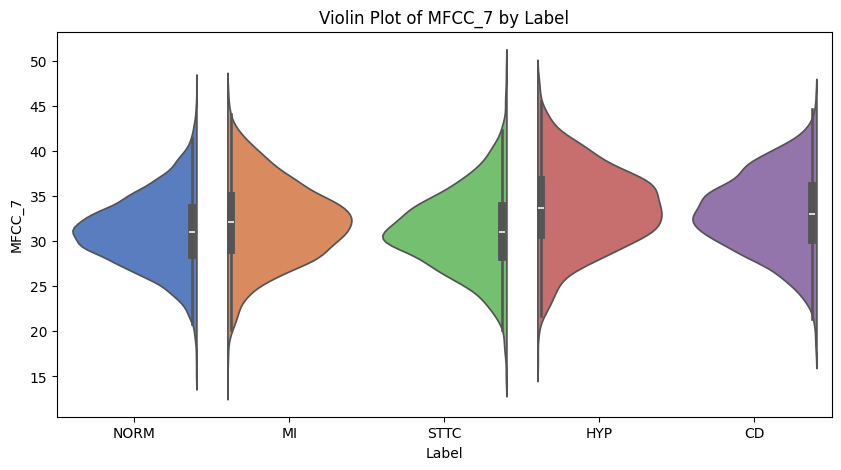

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\1477479357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)


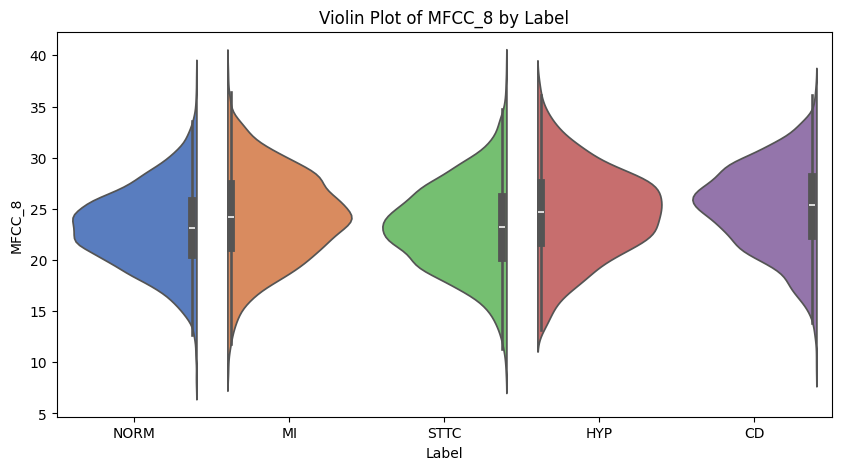

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\1477479357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)


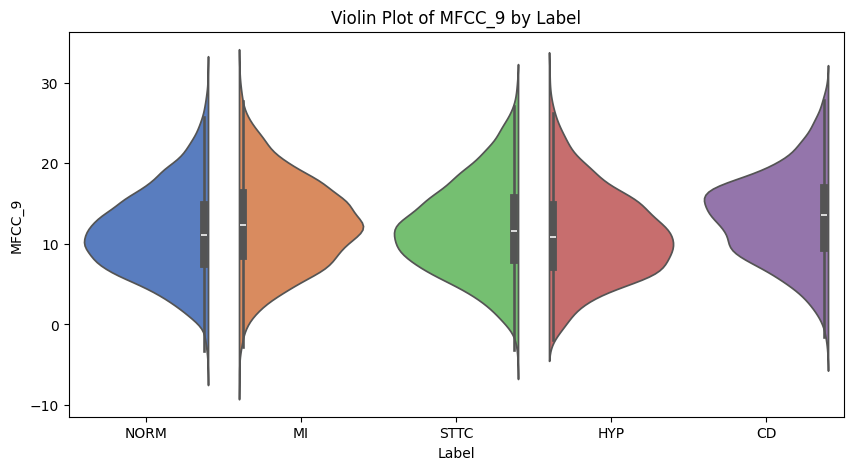

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\1477479357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)


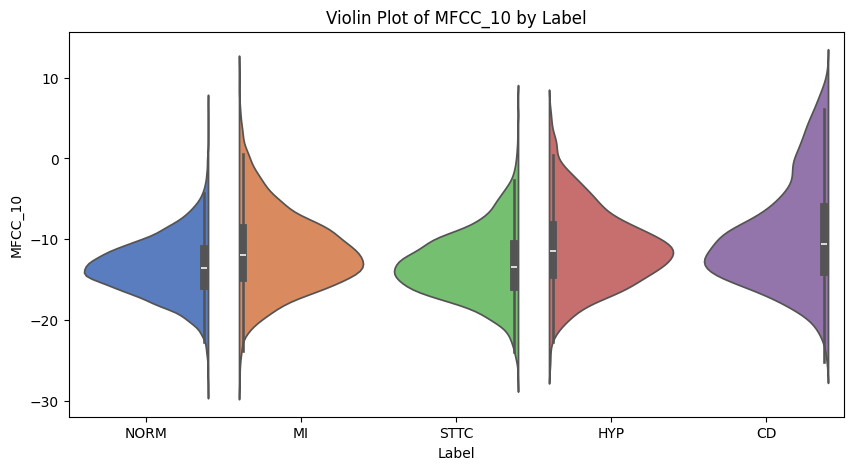

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\1477479357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)


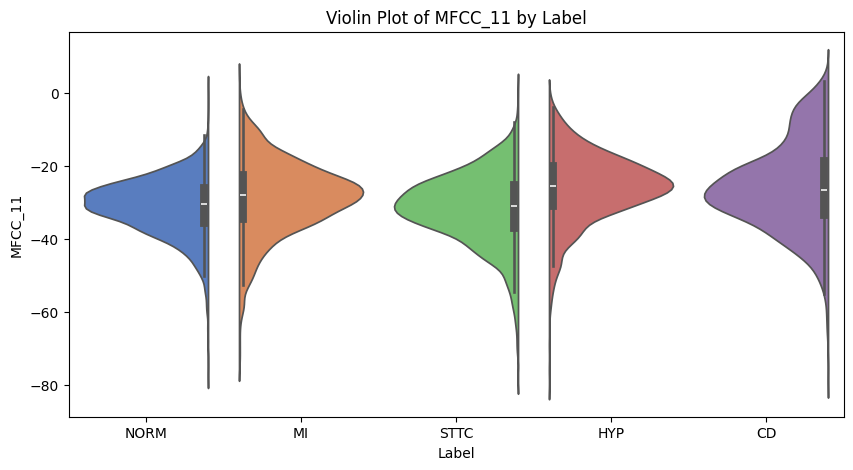

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\1477479357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)


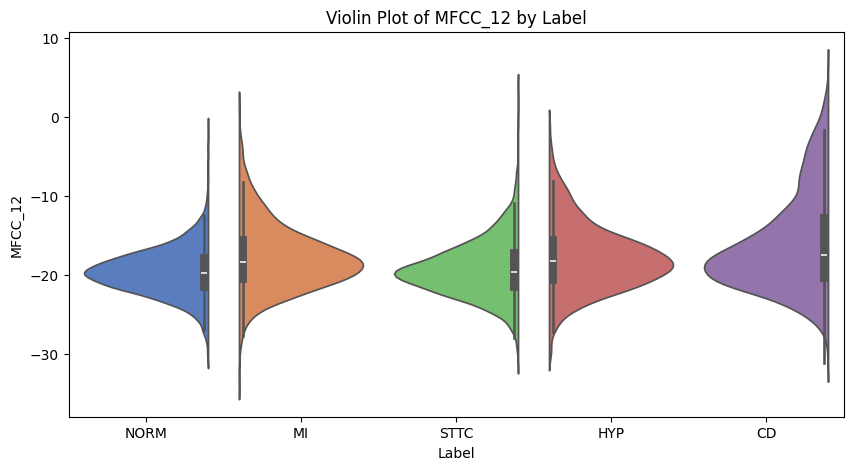

C:\Users\Rishi\AppData\Local\Temp\ipykernel_33028\1477479357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)


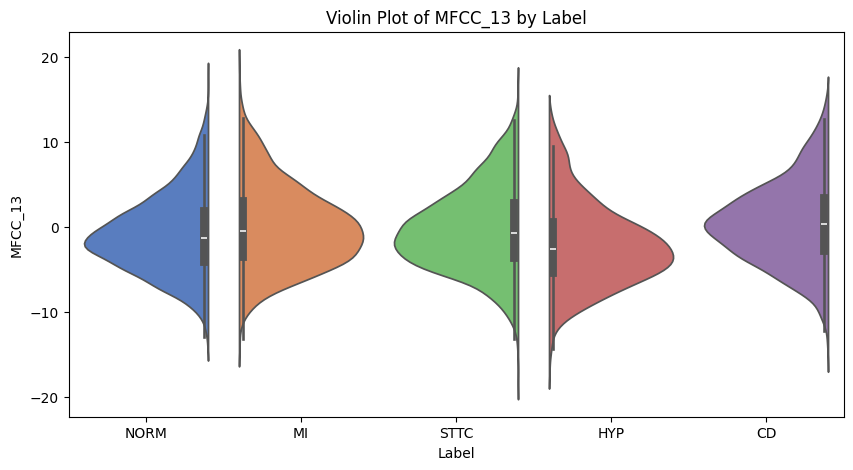

In [10]:
# violin plots
numerical_cols = [col for col in df.select_dtypes(include=np.number).columns if col != "ecg_id"]
for col in numerical_cols:
    plt.figure(figsize=(10, 5))
    sns.violinplot(x="Label", y=col, data=df, palette="muted", split=True)
    plt.title(f"Violin Plot of {col} by Label")
    plt.show()

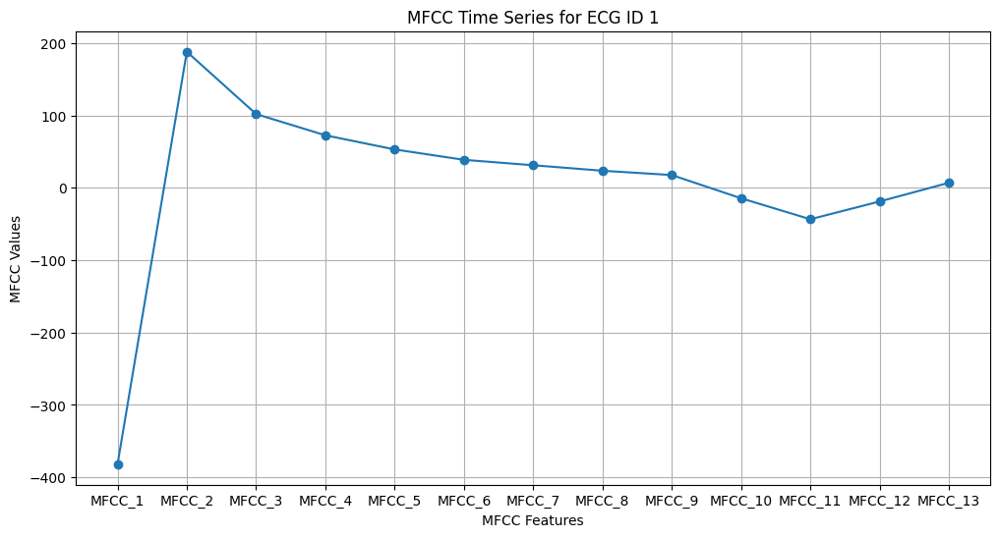

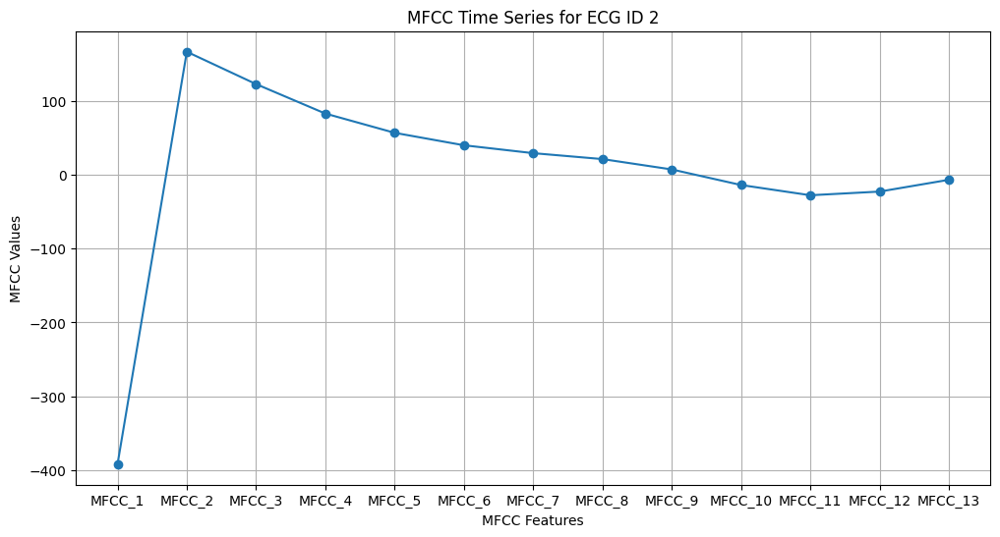

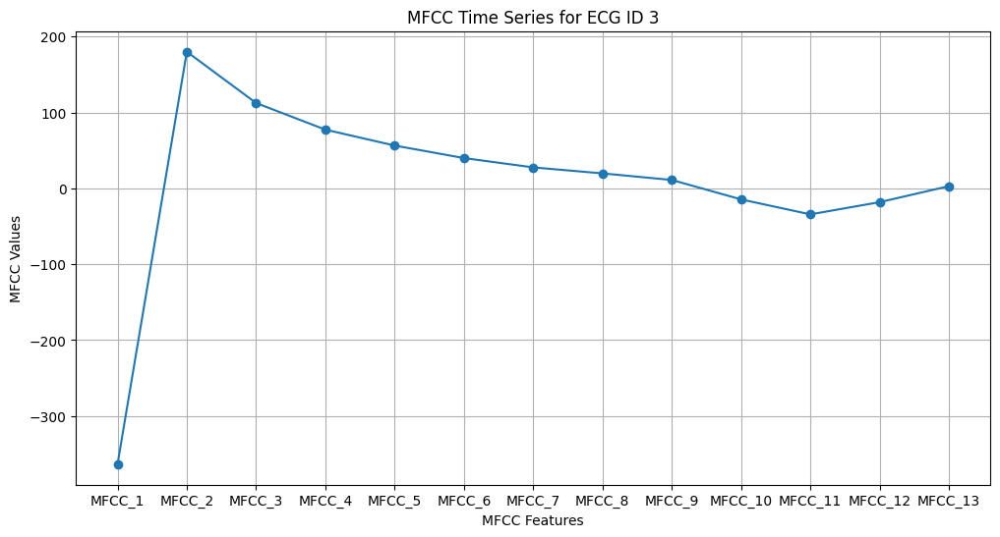

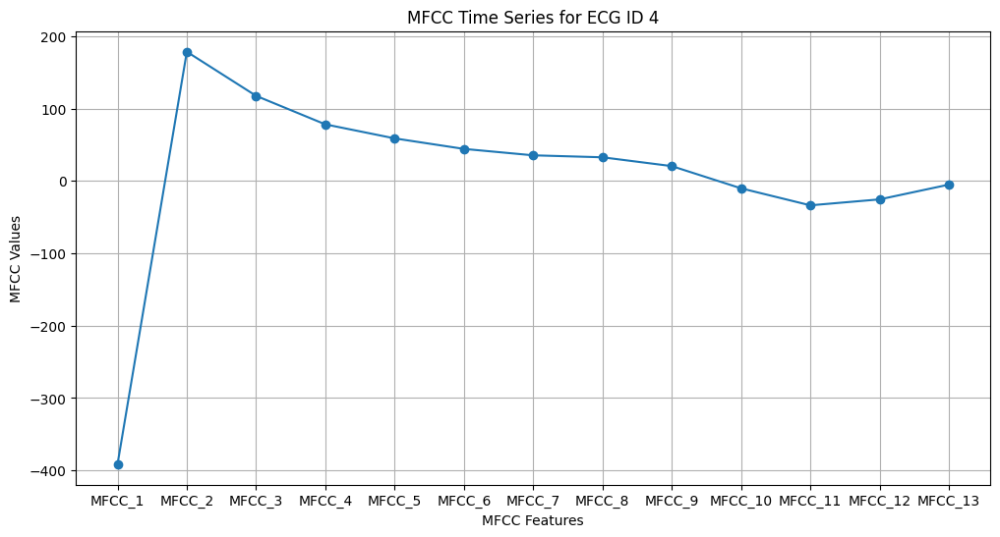

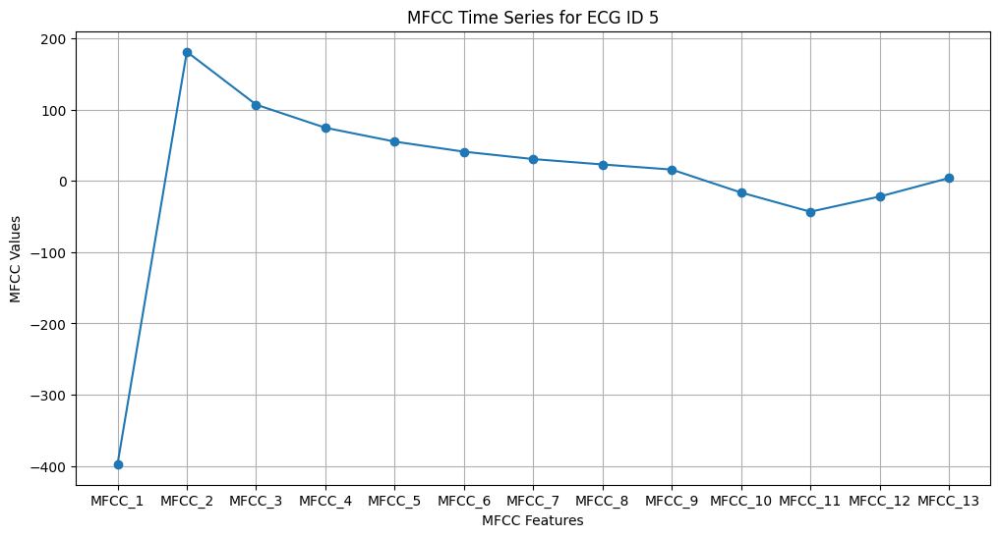

In [11]:
import librosa
import librosa.display

# MFCC Time Series Visualization
mfcc_cols = [col for col in df.columns if "MFCC" in col]
for idx, row in df.iterrows():
    plt.figure(figsize=(12, 6))
    plt.plot(mfcc_cols, row[mfcc_cols], marker='o')
    plt.title(f"MFCC Time Series for ECG ID {row['ecg_id']}")
    plt.xlabel("MFCC Features")
    plt.ylabel("MFCC Values")
    plt.grid()
    plt.show()
    if idx == 4:  # Show only first 5 rows for brevity
        break

       Dominant Frequency  Frequency Power Sum  Mean Frequency  \
count        20860.000000         2.086000e+04    20860.000000   
mean             2.918284         2.122421e+05       11.971046   
std              1.751091         9.564974e+05        2.091933   
min              0.400000         4.345304e+03        5.321274   
25%              1.200000         8.016949e+04       10.803496   
50%              2.900000         1.402242e+05       11.806975   
75%              3.900000         2.384748e+05       12.883889   
max             14.700000         1.048525e+08       28.107224   

       Spectral Entropy  
count      20860.000000  
mean           7.749532  
std            0.274616  
min            6.091323  
25%            7.629133  
50%            7.779133  
75%            7.905169  
max            8.895360  


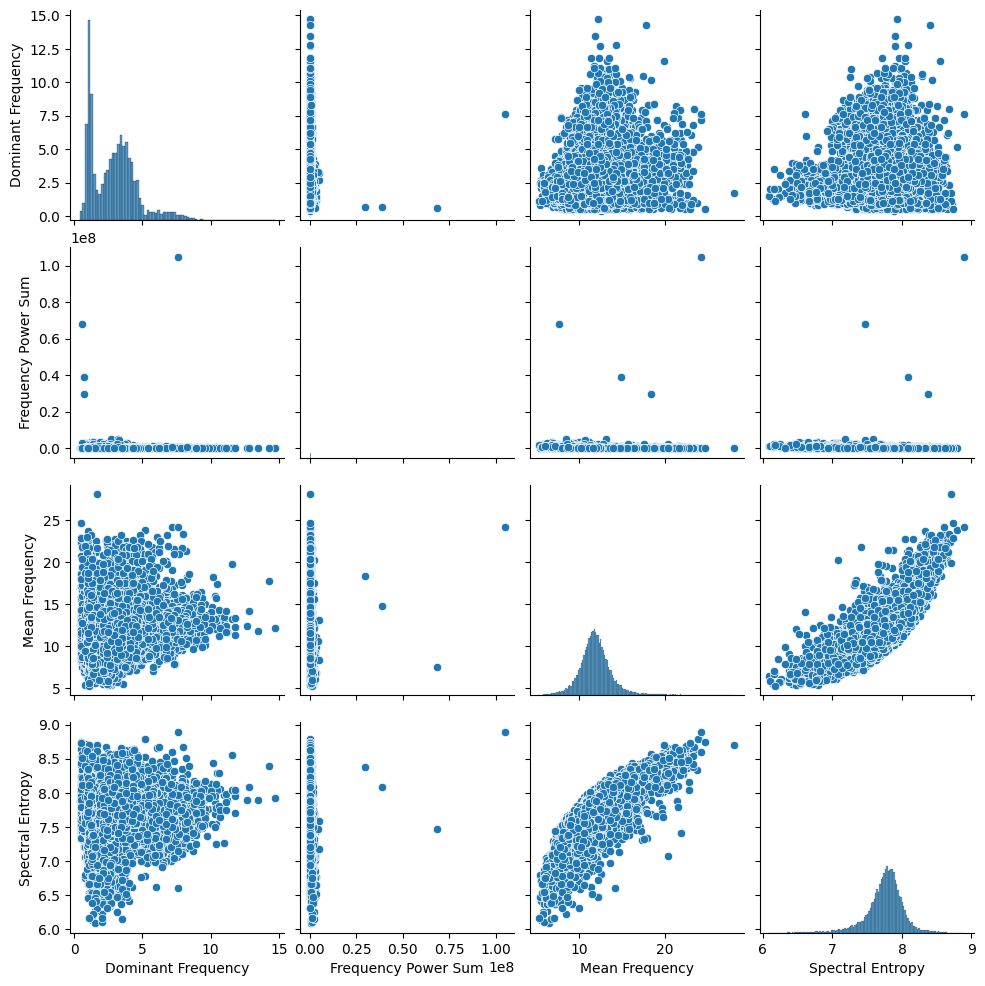

In [14]:
# Basic summary statistics for Fourier-related columns
fourier_columns = ["Dominant Frequency", "Frequency Power Sum", "Mean Frequency", "Spectral Entropy"]
print(df[fourier_columns].describe())

# Pairplot to visualize relationships
sns.pairplot(df[fourier_columns])
plt.show()


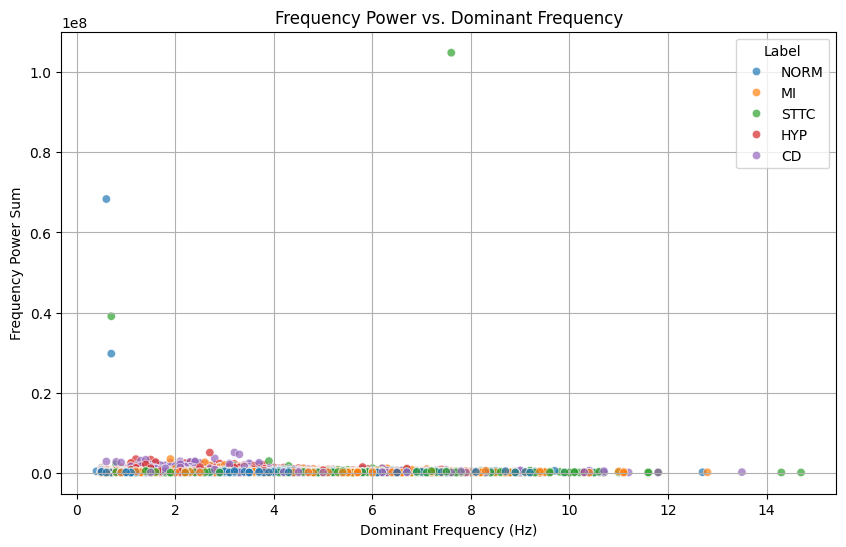

In [15]:
# Frequency vs. Power Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x="Dominant Frequency", y="Frequency Power Sum", hue="Label", alpha=0.7)
plt.title("Frequency Power vs. Dominant Frequency")
plt.xlabel("Dominant Frequency (Hz)")
plt.ylabel("Frequency Power Sum")
plt.legend(title="Label")
plt.grid()
plt.show()


In [16]:
# Defining frequency bands
bands = {
    "Baseline Wander": df["Dominant Frequency"] < 0.5,
    "ECG Signal": (df["Dominant Frequency"] >= 0.5) & (df["Dominant Frequency"] <= 50),
    "Noise": df["Dominant Frequency"] > 50,
}

# Compute power sums in each band
for band, condition in bands.items():
    power_sum = df.loc[condition, "Frequency Power Sum"].sum()
    print(f"Total power in {band} band: {power_sum:.2f}")


Total power in Baseline Wander band: 361405.70
Total power in ECG Signal band: 4427009475.99
Total power in Noise band: 0.00


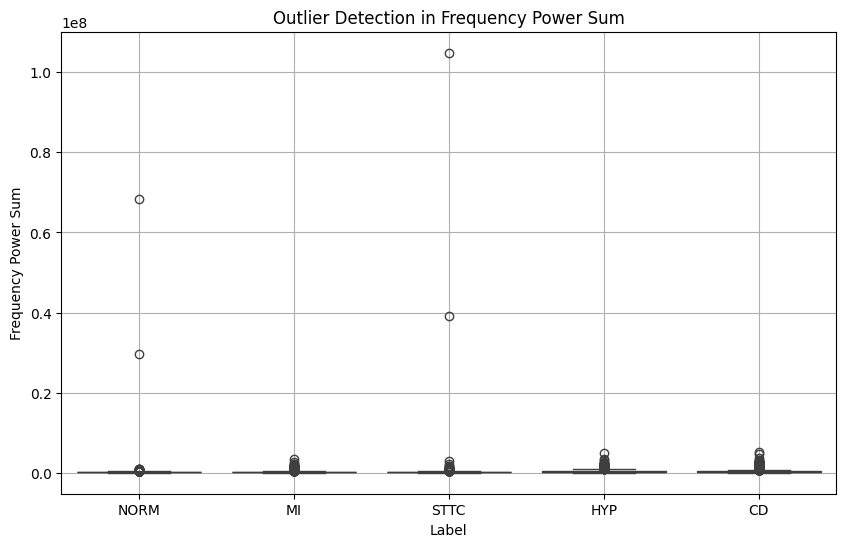

In [17]:
# Boxplot for outlier detection
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="Label", y="Frequency Power Sum")
plt.title("Outlier Detection in Frequency Power Sum")
plt.grid()
plt.show()


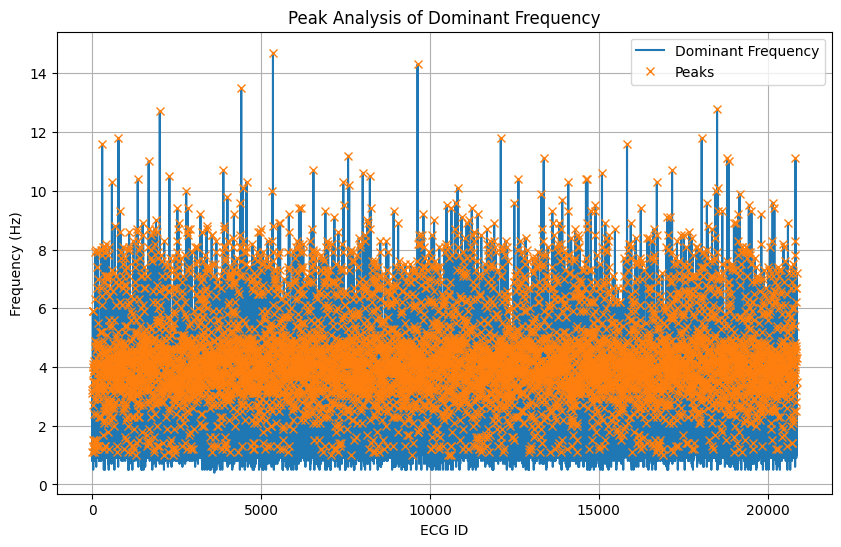

In [19]:
from scipy.signal import find_peaks

# Analyzing peaks in Dominant Frequency
plt.figure(figsize=(10, 6))
peaks, _ = find_peaks(df["Dominant Frequency"], height=0)
plt.plot(df["Dominant Frequency"], label="Dominant Frequency")
plt.plot(peaks, df["Dominant Frequency"].iloc[peaks], "x", label="Peaks")
plt.title("Peak Analysis of Dominant Frequency")
plt.xlabel("ECG ID")
plt.ylabel("Frequency (Hz)")
plt.legend()
plt.grid()
plt.show()


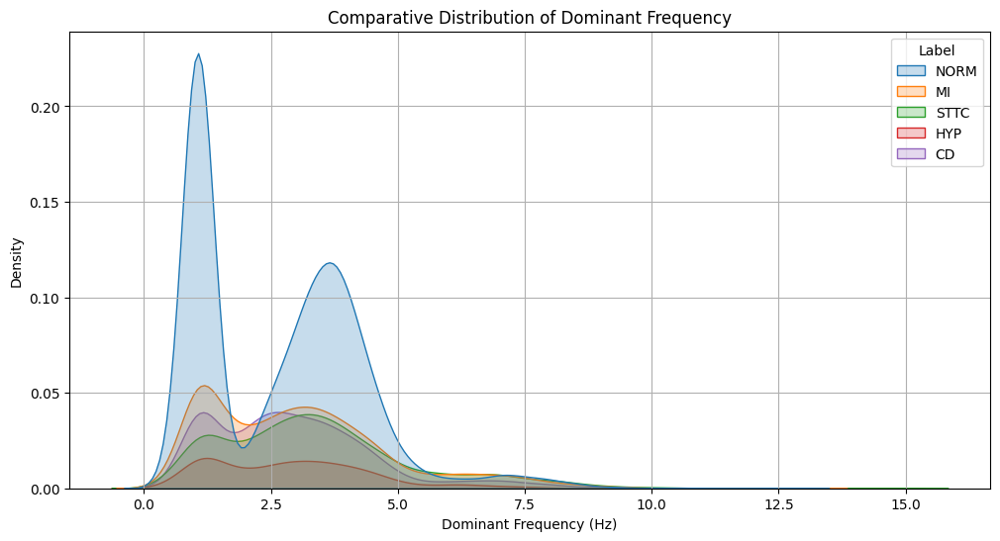

In [20]:
# Comparing normal vs abnormal ECG signals
plt.figure(figsize=(12, 6))
sns.kdeplot(data=df, x="Dominant Frequency", hue="Label", fill=True)
plt.title("Comparative Distribution of Dominant Frequency")
plt.xlabel("Dominant Frequency (Hz)")
plt.ylabel("Density")
plt.grid()
plt.show()


ANOVA Results: F-statistic =  127.88149426567642 , p-value =  4.602032359109977e-108


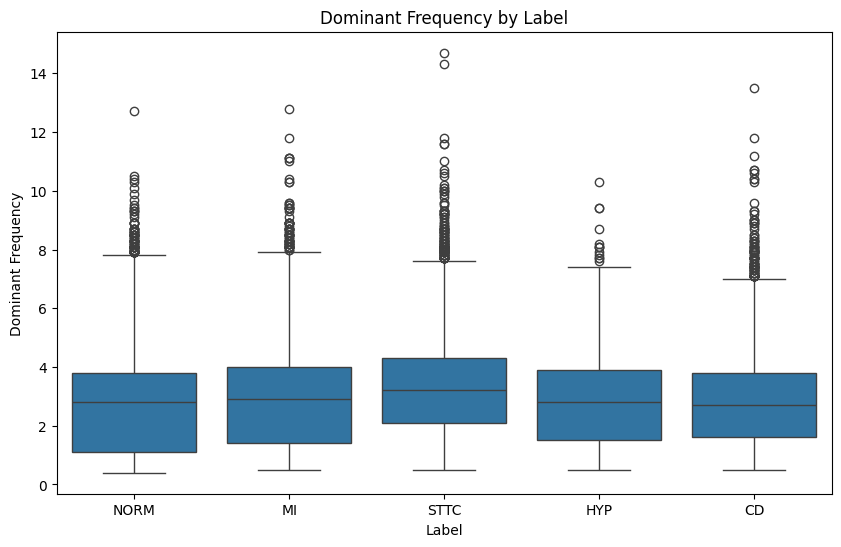

There is a significant difference in Dominant Frequency across groups.


In [23]:
import scipy.stats as stats
# ANOVA Test
anova_results = stats.f_oneway(
    df[df['Label'] == 'NORM']['Dominant Frequency'],
    df[df['Label'] == 'MI']['Dominant Frequency'],
    df[df['Label'] == 'STTC']['Dominant Frequency'],
    df[df['Label'] == 'HYP']['Dominant Frequency'],
    df[df['Label'] == 'CD']['Dominant Frequency']
)

# Print the ANOVA result
print("ANOVA Results: F-statistic = ", anova_results.statistic, ", p-value = ", anova_results.pvalue)

# Plot the boxplot to visualize the differences in Dominant Frequency between groups
plt.figure(figsize=(10,6))
sns.boxplot(x='Label', y='Dominant Frequency', data=df)
plt.title('Dominant Frequency by Label')
plt.show()

# Check if the p-value is below the significance level (e.g., 0.05)
if anova_results.pvalue < 0.05:
    print("There is a significant difference in Dominant Frequency across groups.")
else:
    print("There is no significant difference in Dominant Frequency across groups.")

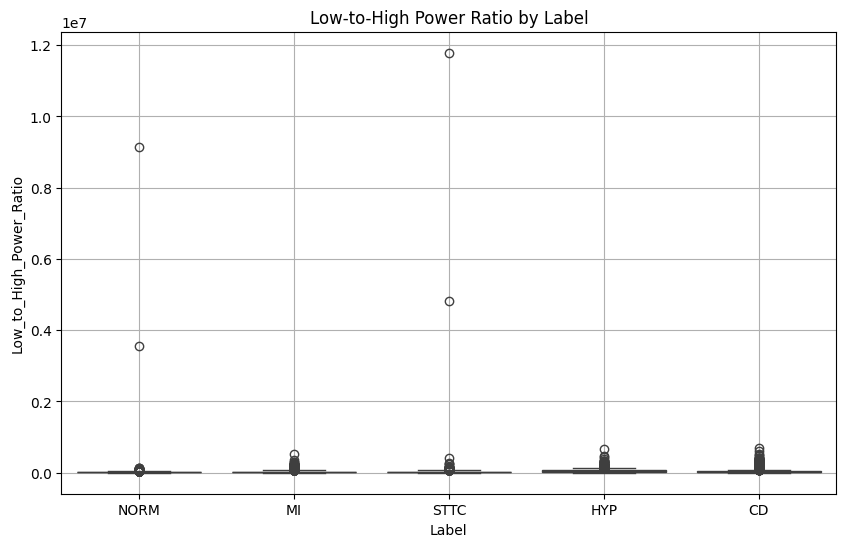

In [24]:
# Example features
df["Low_to_High_Power_Ratio"] = df["Frequency Power Sum"] / (df["Spectral Entropy"] + 1e-5)

# Visualize engineered feature
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="Label", y="Low_to_High_Power_Ratio")
plt.title("Low-to-High Power Ratio by Label")
plt.grid()
plt.show()
